# Raster Workflow

## How start working on raster data?

 **1. Read**

**2. plot and stat**

**3.Nan values**

**4.Normalize**

**5.Reduce noise**

**6. Check stats (mean, max,min, std)**

**7. reduce dimentions**

**8. Check endmembers and abundance of endmembers (NMF)**

**9. RF thresholding ? anomaly detection**

**10. cluster**


**11.RF classiifcation**




## Raster 

In [18]:
hyperspectral_path = r"C:\Users\sakbarpour\Downloads\Mufulira_Sentinel2.tif"


1878


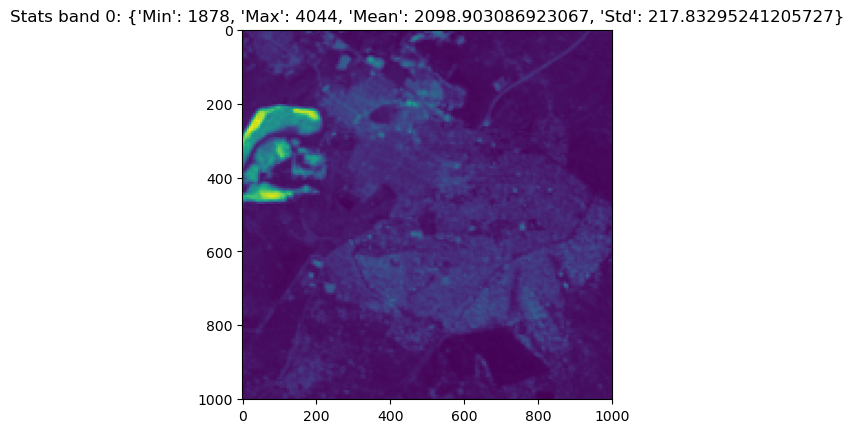

1603


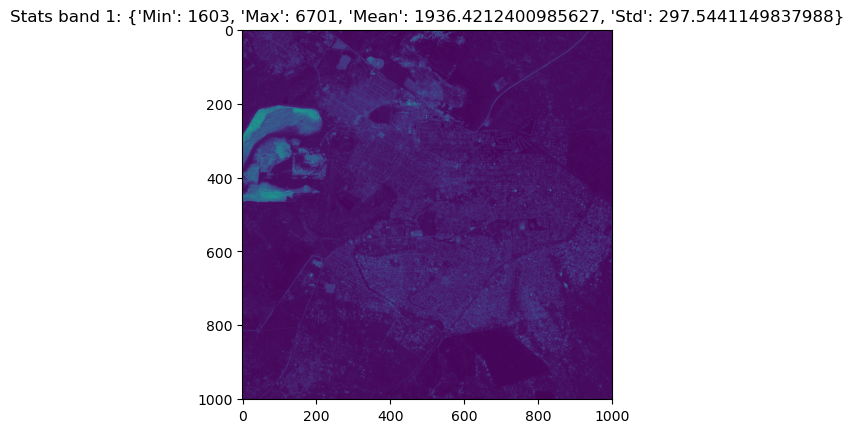

1435


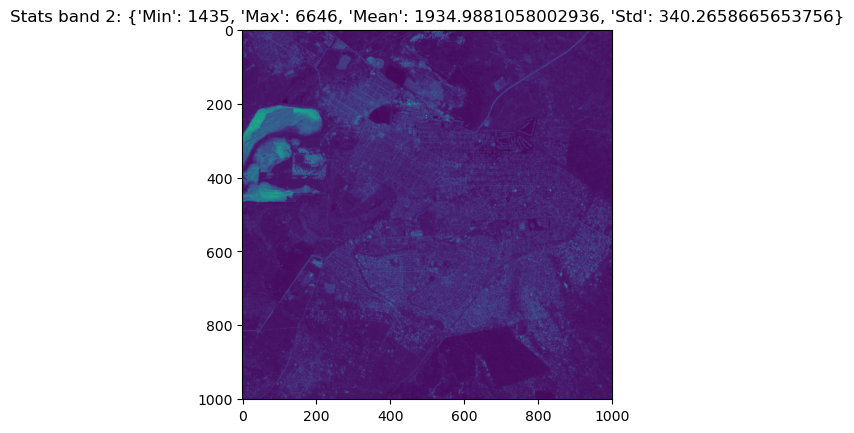

1253


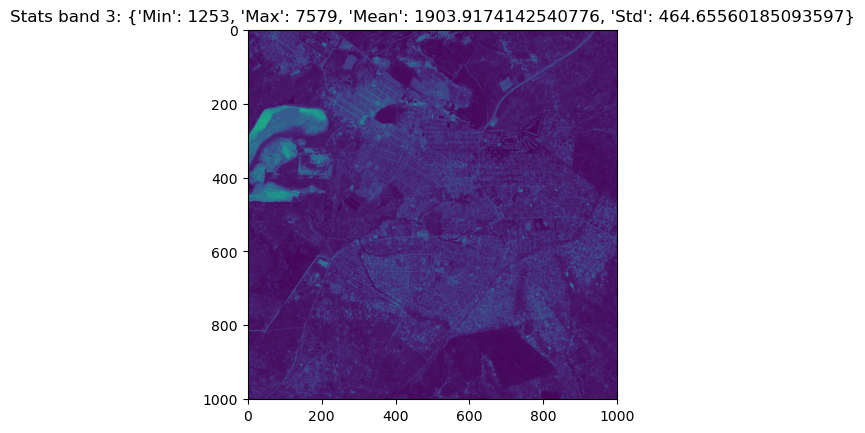

1192


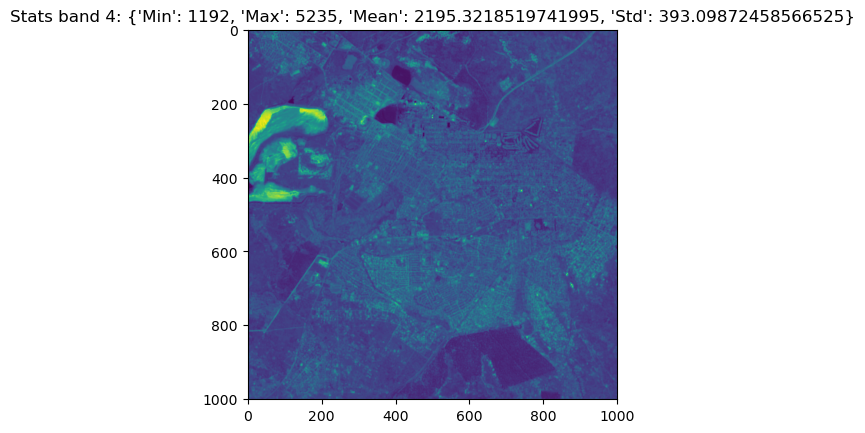

1231


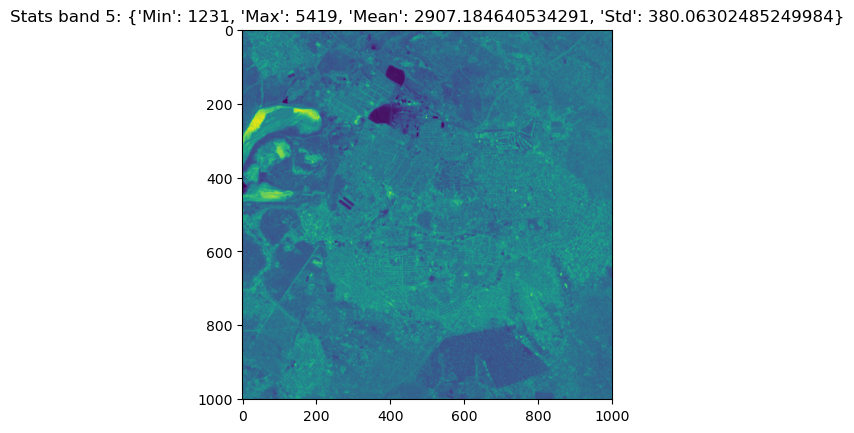

1195


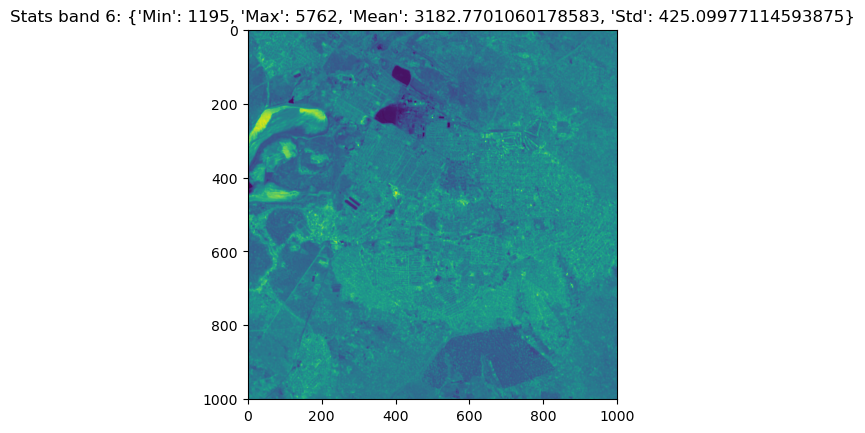

1223


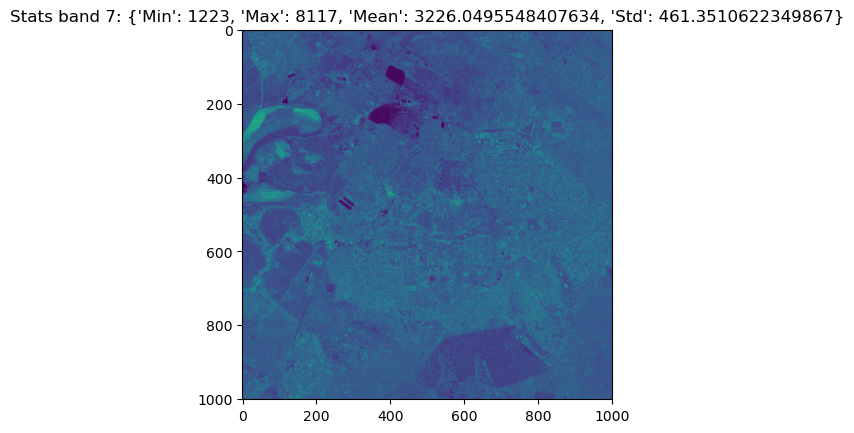

1163


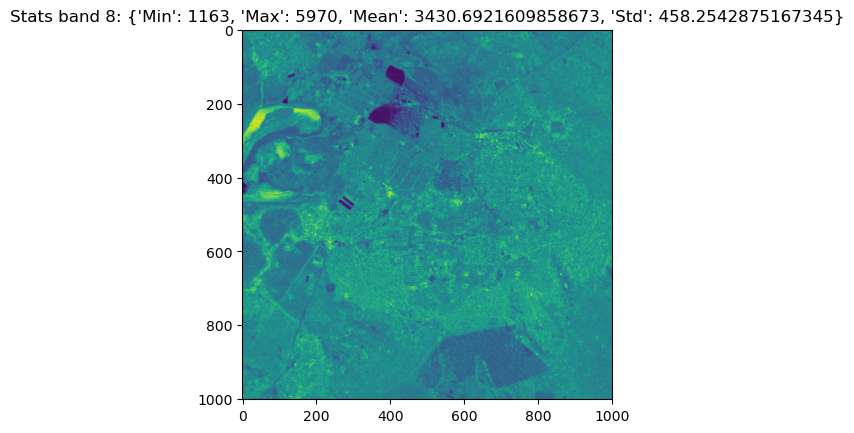

1107


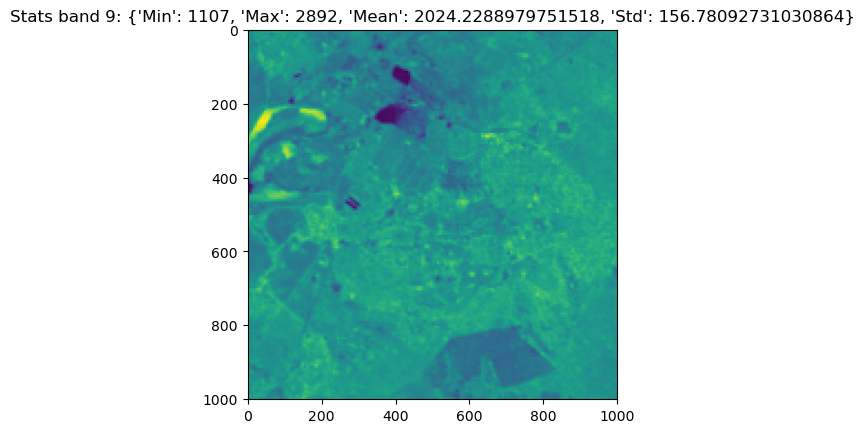

1112


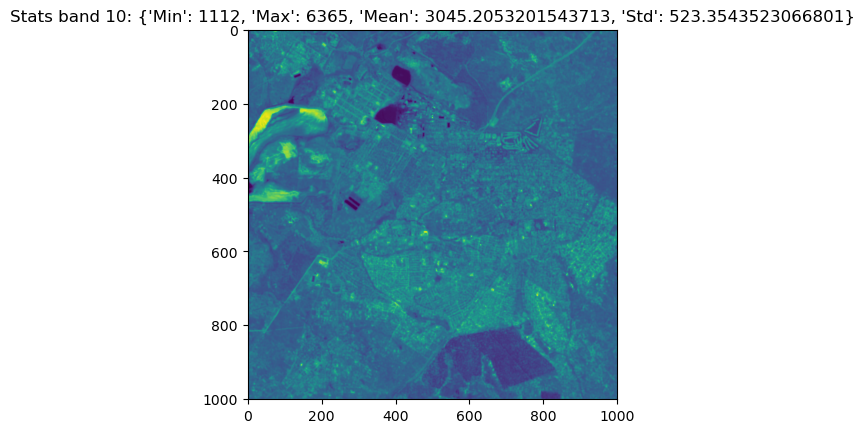

1065


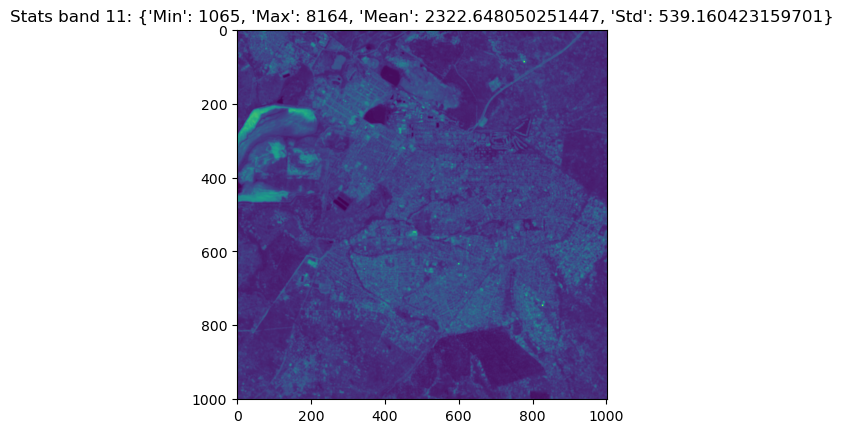

In [26]:
import rasterio
from osgeo import gdal

with rasterio.open(hyperspectral_path) as scr:
    raster_data=scr.read()

bands , height, width= raster_data.shape
for band in range(bands):
    rasterband= raster_data[band, :,:]
    print(rasterband.min())
    statbands= {'Min': rasterband.min(),
                'Max': rasterband.max(),
                'Mean': rasterband.mean(),
                'Std': rasterband.std()}
    plt.imshow(rasterband)
    plt.title(f"Stats band {band}: {statbands}")
    plt.show()

In [30]:
#remove nan
import numpy as np
reshape_raster= raster_data.reshape(12, -1).T
  ##Interpolate

interpolate_nan_raster= np.zeros_like(raster_data)
for band in range(bands):
    band_raster= raster_data[band, :,:]
    mask=np.isnan(band_raster)
    band_raster[mask]=np.mean(band_raster)
    interpolate_nan_raster[band]=band_raster

#remove noise 

from scipy.ndimage import gaussian_filter , median
from scipy.signal import savgol_filter

noise_remove_raster= np.array([scipy.ndimage.gaussian])

In [38]:
import scipy
from scipy.ndimage import gaussian_filter , median_filter
scipy.ndimage.gaussian_filter(band, sigma=2) for band in interpolate_nan_raster


-2.2175799750236784 13.529121717055267 0.9999999999999999
-1.9295417373812387 9.557806263861199 0.9205139664677963
-1.7565150803969976 5.920290544579388 0.8372817415390452


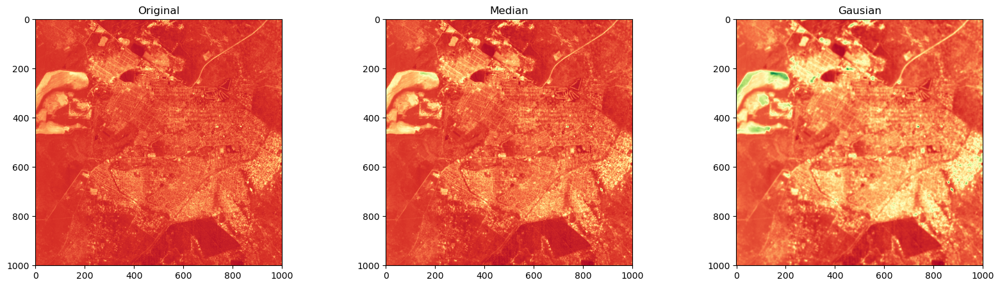

In [44]:
#remove nan
import numpy as np
reshape_raster= raster_data.reshape(12, -1).T
  ##Interpolate

interpolate_nan_raster= np.zeros_like(raster_data)
for band in range(12):
    band_raster= raster_data[band, :,:]
    mask=np.isnan(band_raster)
    band_raster[mask]=np.mean(band_raster)
    interpolate_nan_raster[band]=band_raster


# Normalized raster 

from sklearn.preprocessing import StandardScaler

scale=StandardScaler()
normalized_raster=np.array([scale.fit_transform(band) for band in interpolate_nan_raster])



# remove noise
import scipy
from scipy.ndimage import gaussian_filter
from scipy.ndimage import median_filter

median_filter_raster= np.array([scipy.ndimage.median_filter(band, size=3) for band in normalized_raster])
gaussian_filter_raster=np.array([scipy.ndimage.gaussian_filter(band, sigma=2) for band in normalized_raster])

fig, axs= plt.subplots(1,3, figsize=(20,5))
axs[0].imshow(normalized_raster[2,:,:], cmap='RdYlGn')
axs[0].set_title("Original")

print(normalized_raster[2,:,:].min(), normalized_raster[2,:,:].max(), normalized_raster[2,:,:].std())

axs[1].imshow(median_filter_raster[2,:,:], cmap='RdYlGn')
axs[1].set_title("Median")
print(median_filter_raster[2,:,:].min(), median_filter_raster[2,:,:].max(), median_filter_raster[2,:,:].std())
axs[2].imshow(gaussian_filter_raster[2,:,:], cmap='RdYlGn')
axs[2].set_title("Gausian")
print(gaussian_filter_raster[2,:,:].min(), gaussian_filter_raster[2,:,:].max(), gaussian_filter_raster[2,:,:].std())


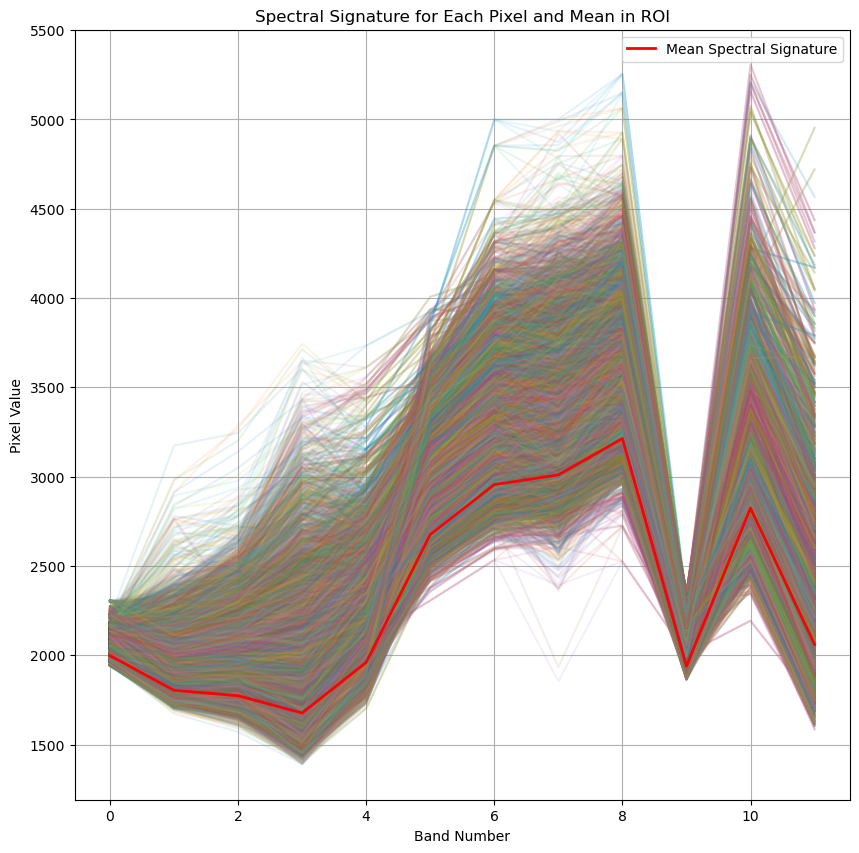

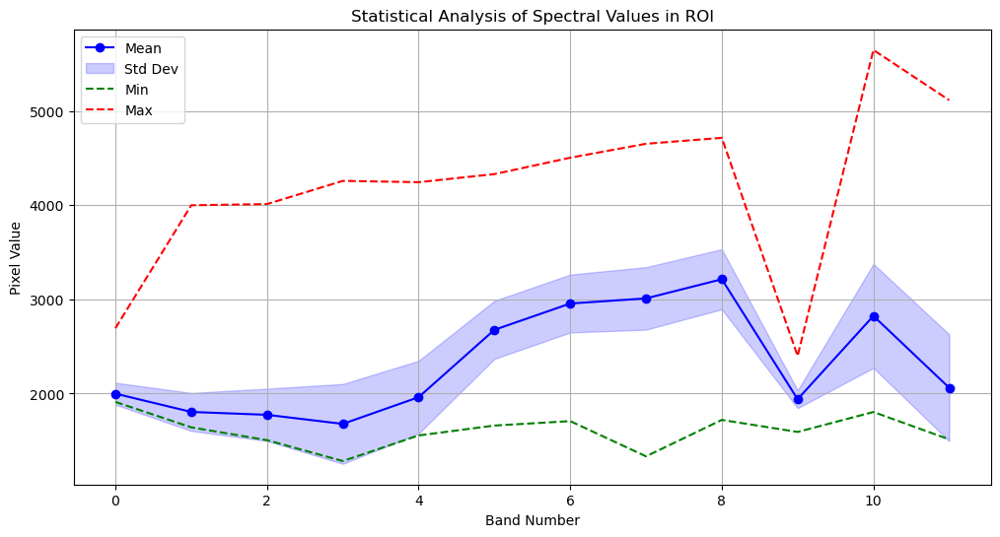

In [45]:
import matplotlib.pyplot as  plt

mean_values= np.mean(raster_data[:, 600:700, 100:200], axis=(1,2))
max_raster=np.max(raster_data[:, 600:700, 100:200], axis=(1,2))
std_values = np.std(raster_data[:, 600:700, 100:200], axis=(1, 2))
min_values = np.min(raster_data[:, 600:700, 100:200], axis=(1, 2))
max_values = np.max(raster_data[:, 600:700, 100:200], axis=(1, 2))

plt.figure(figsize=(10,10))
bands = np.arange(raster_data.shape[0])


for i in range(700 - 600):
    for j in range(200 - 100):
        plt.plot(bands, raster_data[:, i, j], alpha=0.1)

# Plot the mean spectral signature

plt.plot(bands, mean_values, color='red', linewidth=2, label='Mean Spectral Signature')

# Set labels and title
plt.xlabel('Band Number')
plt.ylabel('Pixel Value')
plt.title('Spectral Signature for Each Pixel and Mean in ROI')
plt.legend()
plt.grid(True)
plt.show()

# Plot statistics for each band
plt.figure(figsize=(12, 6))

plt.plot(bands, mean_values, label='Mean', color='blue', marker='o')
plt.fill_between(bands, mean_values - std_values, mean_values + std_values, color='blue', alpha=0.2, label='Std Dev')
plt.plot(bands, min_values, label='Min', color='green', linestyle='--')
plt.plot(bands, max_values, label='Max', color='red', linestyle='--')

# Set labels and title
plt.xlabel('Band Number')
plt.ylabel('Pixel Value')
plt.title('Statistical Analysis of Spectral Values in ROI')
plt.legend()
plt.grid(True)
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


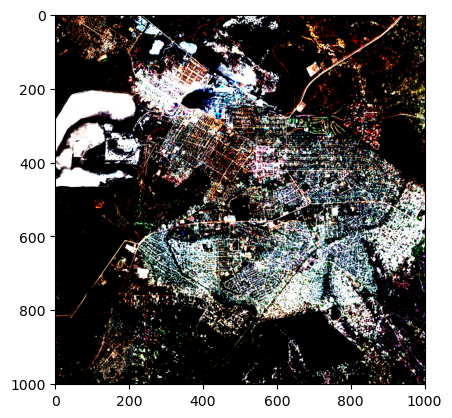

In [46]:
rgb_image = np.stack((normalized_raster[3], normalized_raster[2], normalized_raster[1]), axis=-1)
rgb_image=np.dstack((normalized_raster[3], normalized_raster[2], normalized_raster[1]))
plt.imshow(rgb_image)

In [48]:
median_filter_raster.min()

-5.310698527592644

In [55]:
pca_raster.shape[0]

4

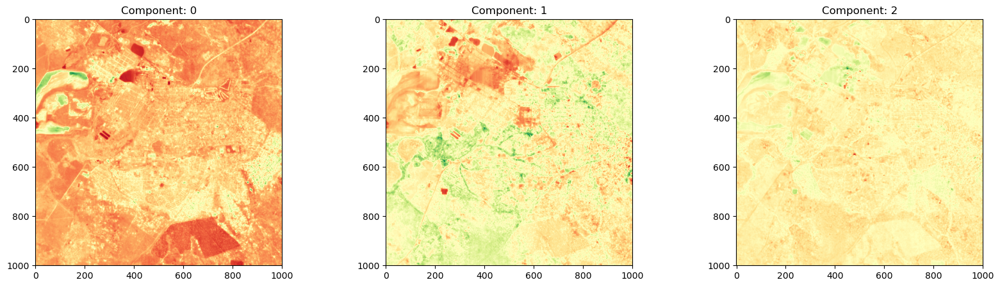

In [81]:
from sklearn.decomposition import PCA
reshape_raster= median_filter_raster.reshape(12, -1).T
pca=PCA(n_components=3)
pca_raster_bands=pca.fit_transform(reshape_raster)
pca_raster=pca_raster_bands.T.reshape(3, height,width)
fig, axis=plt.subplots(1, pca_raster.shape[0],  figsize=(20, 5))
for i in range(pca_raster.shape[0]):
    axis[i].imshow(pca_raster[i,:,:], cmap="RdYlGn")
    axis[i].set_title(f"Component: {i}")
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'Clustered')

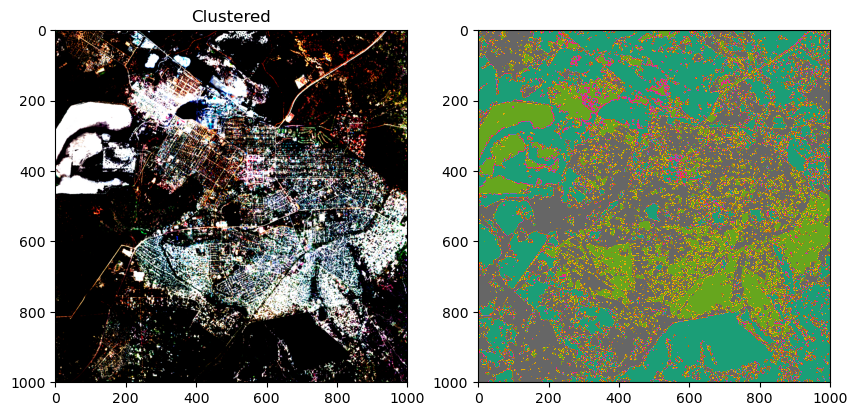

In [82]:
from sklearn.cluster import KMeans
reshaped_raster= pca_raster.reshape(3, -1).T
kmeans= KMeans(n_clusters=3)
cluster_2d=kmeans.fit_predict(reshaped_raster)
kmeans_raster=cluster_2d.reshape(height, width)
fig, axs= plt.subplots(1, 2, figsize=(10,5))
axs[0].imshow(rgb_image)
axs[0].set_title('RGB image')
axs[1].imshow(kmeans_raster, cmap="Dark2")
axs[0].set_title('Clustered')


#### Endmembers:


Definition: Endmembers are pure spectral signatures or spectra that represent the purest form of materials present in a hyperspectral image. Each endmember corresponds to a specific material or class.

Role: Endmembers act as the reference spectra against which the mixed spectra of pixels are compared. They are the building blocks of the mixed spectral signals observed in hyperspectral data.

Extraction: Techniques like Non-negative Matrix Factorization (NMF), Principal Component Analysis (PCA), Vertex Component Analysis (VCA), and others can be used to extract endmembers from hyperspectral data.

Characteristics: Endmembers have high spectral purity and distinct spectral features that distinguish them from other materials.

Abundances:

Definition: Abundances are the proportions or fractions of endmembers present in a mixed pixel. Each pixel in a hyperspectral image is often a mixture of several endmembers, and the abundance values represent the contribution of each endmember to the mixed pixel’s spectrum.

Role: Abundances quantify the presence of each endmember within a pixel. They are used to determine the composition of materials within each pixel of the hyperspectral image.

Calculation: Abundances are calculated through spectral unmixing techniques that decompose the observed spectral signature of a pixel into a linear or non-linear combination of endmember spectra.

Constraints: In many unmixing methods, abundances are subject to constraints such as non-negativity (abundance values cannot be negative) and sum-to-one (the sum of all abundance values for a pixel should be 1).

Relationship between Endmembers and Abundances:

Spectral Mixing Model: The observed spectral signature of a pixel is modeled as a combination of endmember spectra weighted by their corresponding abundance values. In a linear mixing model, this relationship can be expressed as:


𝑦=𝐸⋅𝑎+𝑛
y=E⋅a+n

where:
𝑦
y is the observed spectral signature of a pixel.
𝐸
E is the matrix of endmember spectra.
𝑎
a is the vector of abundance values.
𝑛
n is the noise or error term.
Interpretation: By decomposing the observed spectral signature into endmembers and their abundances, we can interpret the material composition of each pixel in terms of the presence and proportions of different materials.
Example Illustration:
Imagine a hyperspectral image of a forested area. Endmembers might include:

Tree leaves: Spectral signature of pure leaf material.
Soil: Spectral signature of bare soil.
Water: Spectral signature of water bodies.
Each pixel in the hyperspectral image might be a mixture of these endmembers. Abundances will indicate how much of each endmember (tree leaves, soil, water) is present in that pixel. For example:

Pixel 1: 70% tree leaves, 20% soil, 10% water.
Pixel 2: 50% tree leaves, 50% soil, 0% water.

Visualization:

Endmembers Plot: This plot provides an understanding of the spectral characteristics of each endmember.
Abundance Maps: These maps show the spatial distribution of each endmember, allowing for the analysis of where each material is predominantly located in the image.

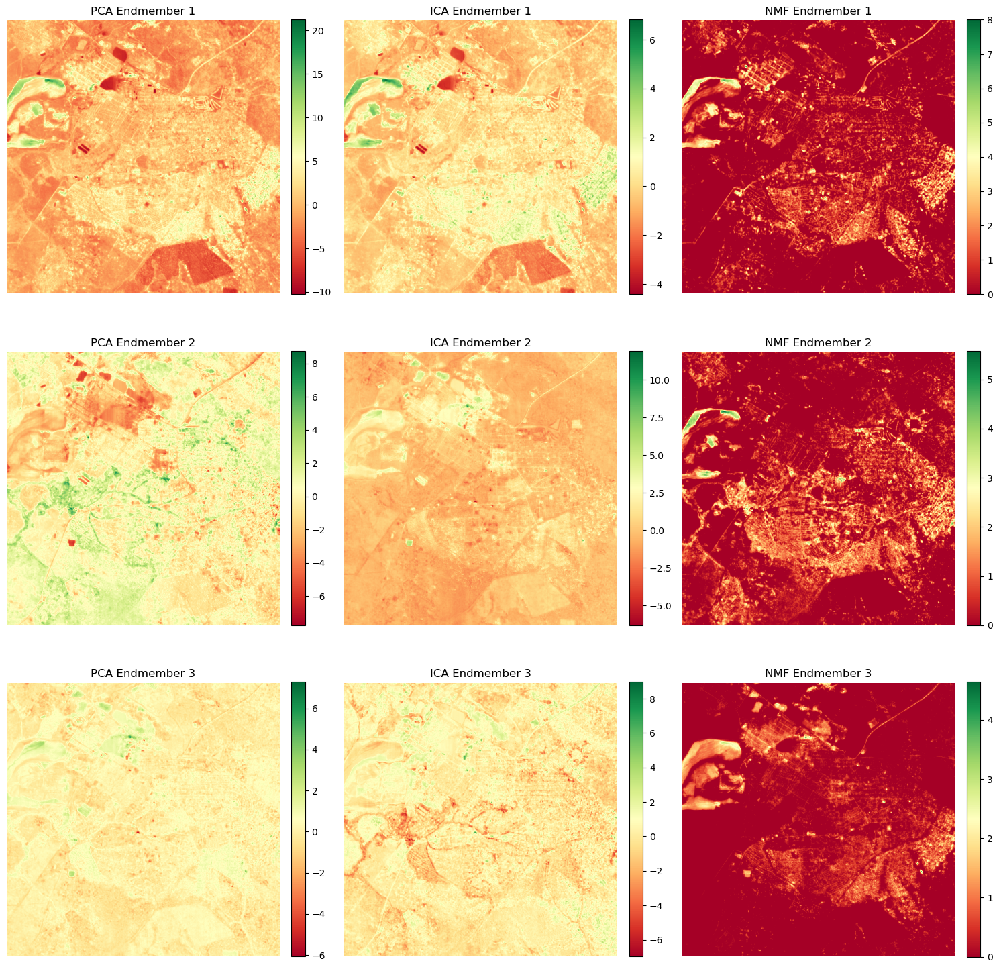

In [129]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA, FastICA, NMF
from scipy.stats import describe

# Assuming `normalized_raster` is a 3D numpy array with shape (bands, height, width)
bands, height, width = median_filter_raster.shape
reshaped_raster = median_filter_raster.reshape(bands, height * width).T  # Reshape for PCA/ICA/NMF

# Perform PCA
pca = PCA(n_components=3)  # Choose the number of endmembers
pca_endmembers = pca.fit_transform(reshaped_raster)

# Perform ICA
ica = FastICA(n_components=3)  # Choose the number of endmembers
ica_endmembers = ica.fit_transform(reshaped_raster)

# Perform NMF
reshaped_raster=np.maximum(reshaped_raster,0)
nmf = NMF(n_components=3, init='random', random_state=0)
nmf_endmembers = nmf.fit_transform(reshaped_raster)

# Reshape back to original spatial dimensions for visualization
pca_endmembers_reshaped = pca_endmembers.T.reshape(3, height, width)
ica_endmembers_reshaped = ica_endmembers.T.reshape(3, height, width)
nmf_endmembers_reshaped = nmf_endmembers.T.reshape(3, height, width)

fig, axes = plt.subplots(3, 3, figsize=(15, 15))
cmap = 'RdYlGn'
titles = ['PCA', 'ICA', 'NMF']

for i in range(3):
    axes[i, 0].imshow(pca_endmembers_reshaped[i], cmap=cmap)
    axes[i, 0].set_title(f'PCA Endmember {i+1}')
    axes[i, 0].axis('off')
    fig.colorbar(axes[i, 0].imshow(pca_endmembers_reshaped[i], cmap=cmap), ax=axes[i, 0], fraction=0.046, pad=0.04)

    axes[i, 1].imshow(ica_endmembers_reshaped[i], cmap=cmap)
    axes[i, 1].set_title(f'ICA Endmember {i+1}')
    axes[i, 1].axis('off')
    fig.colorbar(axes[i, 1].imshow(ica_endmembers_reshaped[i], cmap=cmap), ax=axes[i, 1], fraction=0.046, pad=0.04)

    axes[i, 2].imshow(nmf_endmembers_reshaped[i], cmap=cmap)
    axes[i, 2].set_title(f'NMF Endmember {i+1}')
    axes[i, 2].axis('off')
    fig.colorbar(axes[i, 2].imshow(nmf_endmembers_reshaped[i], cmap=cmap), ax=axes[i, 2], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

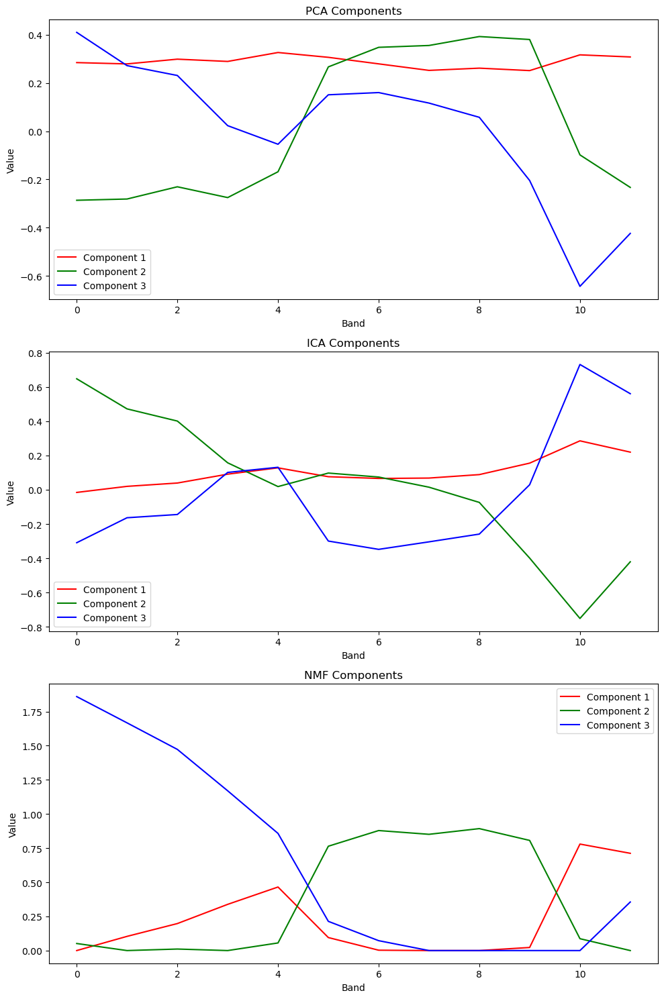

In [130]:
# Plot all components of each method in one plot
fig, axes = plt.subplots(3, 1, figsize=(10, 15))

methods = ['PCA', 'ICA', 'NMF']
components = [pca.components_, ica.components_, nmf.components_]
colors = ['r', 'g', 'b']  # Colors for different components

for i, (ax, method_components) in enumerate(zip(axes, components)):
    for j in range(method_components.shape[0]):
        ax.plot(method_components[j], label=f'Component {j+1}', color=colors[j])
    ax.set_title(f'{methods[i]} Components')
    ax.set_xlabel('Band')
    ax.set_ylabel('Value')
    ax.legend()

plt.tight_layout()
plt.show()

In [132]:
# Statistical analysis of abundance maps
for i in range(3):
    pca_stats = describe(pca_abundance_maps[i].flatten())
    ica_stats = describe(ica_abundance_maps[i].flatten())
    nmf_stats = describe(nmf_abundance_maps[i].flatten())
    print(f'PCA Abundance Map {i+1} Stats: {pca_stats}')
    print(f'ICA Abundance Map {i+1} Stats: {ica_stats}')
    print(f'NMF Abundance Map {i+1} Stats: {nmf_stats}')


PCA Abundance Map 1 Stats: DescribeResult(nobs=1002001, minmax=(-10.223792130195546, 19.033218828015723), mean=-0.3490874031091276, variance=3.79649055342672, skewness=1.225197562283433, kurtosis=8.931872887215572)
ICA Abundance Map 1 Stats: DescribeResult(nobs=1002001, minmax=(-12.130585165380111, 6.617141629356176), mean=-0.2217831776497305, variance=1.1833134555843035, skewness=-0.415750153393274, kurtosis=3.1858129657804524)
NMF Abundance Map 1 Stats: DescribeResult(nobs=1002001, minmax=(0.0, 8.0085082291479), mean=0.42735554315089336, variance=0.6040433838935857, skewness=2.537615061889628, kurtosis=7.684609796986498)
PCA Abundance Map 2 Stats: DescribeResult(nobs=1002001, minmax=(-10.2867399301712, 21.231635268561106), mean=0.35366621422229777, variance=3.223287467690072, skewness=1.2609655230010224, kurtosis=5.59407863224882)
ICA Abundance Map 2 Stats: DescribeResult(nobs=1002001, minmax=(-8.026408357678271, 6.966194828687072), mean=0.13378463807761357, variance=0.96062900747434

Interpretation
PCA Abundance Maps:

Generally have a higher variance and mean values compared to ICA and NMF.
The distributions are more heavy-tailed (kurtosis) with significant positive skewness, indicating more pronounced outliers or extreme values.

ICA Abundance Maps:

Have lower variance and mean values compared to PCA and NMF.
The skewness and kurtosis values are closer to normal distribution with less pronounced tails.

NMF Abundance Maps:

Show higher positive skewness and kurtosis values, indicating a distribution with more pronounced outliers and heavy tails.
The mean values are relatively low but can be higher in the first two abundance maps.
Each method yields abundance maps with distinct statistical characteristics, reflecting the different approaches in decomposing the data. The choice of method should be guided by the specific application and the nature of the data being analyzed.

In summary, the choice of method depends on your data characteristics and analysis goals. NMF is often preferred for mineral detection due to its non-negativity constraints and interpretability, but PCA and ICA might also provide valuable insights depending on the nature of your data and analysis objectives.


In [146]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, roc_auc_score, classification_report, accuracy_score, precision_score, recall_score, f1_score

# Assuming `raster_data` and `kmeans_raster_array` are your hyperspectral data and labels
# Flatten hyperspectral data and labels
reshaped_raster_median = median_filter_raster.reshape(median_filter_raster.shape[0], -1).T  # Shape: (pixels, bands)
labels=kmeans_raster.reshape(-1)# Flatten labels to 1D


X_train, X_test, y_train, y_test = train_test_split(reshaped_raster_median, labels, test_size=0.3, random_state=42)



# Initialize and train the RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

# Predict class labels for the test set
y_pred = rf.predict(X_test)
y_proba = rf.predict_proba(X_test)  # Probability estimates for all classes

In [147]:
# Compute metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print classification report and metrics
print("Classification Report:\n", classification_report(y_test, y_pred))
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99    119684
           1       0.99      0.99      0.99     55406
           2       0.99      0.99      0.99    125511

    accuracy                           0.99    300601
   macro avg       0.99      0.99      0.99    300601
weighted avg       0.99      0.99      0.99    300601

Accuracy: 0.99
Precision: 0.99
Recall: 0.99
F1 Score: 0.99


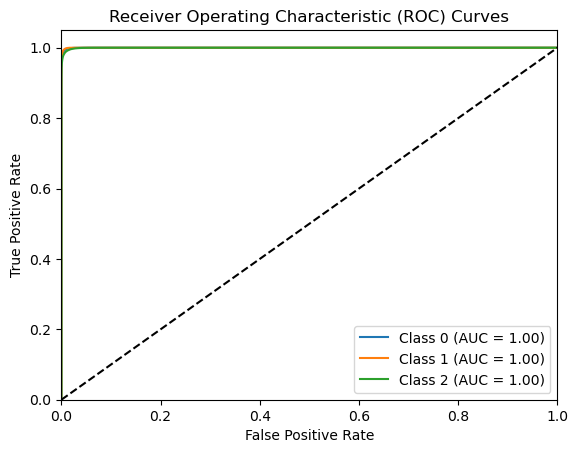

In [148]:
# Binarize the output for ROC curve computation
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_binarized.shape[1]


# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_binarized[:, i], y_proba[:, i])
    roc_auc[i] = roc_auc_score(y_test_binarized[:, i], y_proba[:, i])

# Plot ROC curves
plt.figure()
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curves')
plt.legend(loc='lower right')
plt.show()


# CSV or text Data WorkFlow

In [5]:
! pip install pandas

In [67]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, roc_auc_score, classification_report, accuracy_score, precision_score, recall_score, f1_score
import pandas as pd

In [10]:
hyperspectral_text_path= r'c:\Repos\Data\ML_repo_geo\Randomhyperspectral_text.txt'
hyper_read=pd.read_csv(hyperspectral_text_path)
hyper_read.head(500)

,200,68,268
0,0.000000,NaN,NaN
1,0.000025,NaN,NaN
2,0.000041,NaN,NaN
3,0.000048,NaN,NaN
4,0.000056,NaN,NaN
...,...,...,...
495,0.002307,NaN,NaN
496,0.003009,NaN,NaN
497,0.003840,NaN,NaN
498,0.004577,NaN,NaN


200 68 268
Original shape (height, width, bands): (200, 68, 268)
Transposed shape (bands, height, width): (268, 200, 68)


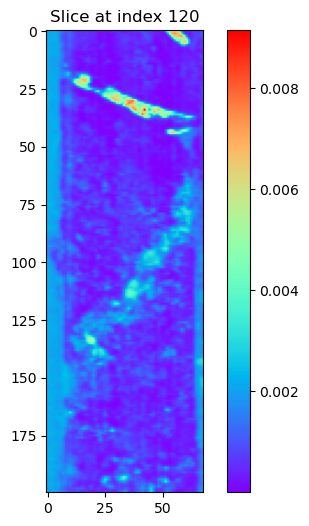

In [66]:
import numpy as np
import matplotlib.pyplot as plt


# Read and reshape the data
with open(hyperspectral_text_path, 'r') as swir_text:
    nx, ny, nz = [int(i) for i in swir_text.readline().rstrip().split(',')]
    print(nx, ny, nz)
    swir_text_array = np.zeros((nx * ny * nz), np.float32)
    i = 0
    for line in swir_text:
        swir_text_array[i] = float(line)
        i += 1
    # Reshape the array to (height, width, bands)
    swir_text_array = swir_text_array.reshape(nx, ny, nz)
    print("Original shape (height, width, bands):", swir_text_array.shape)
    
    # Transpose the array to (bands, height, width)
    swir_text_array = swir_text_array.transpose(2, 0, 1)
    print("Transposed shape (bands, height, width):", swir_text_array.shape)

# Visualize a specific slice of the data
slice_index = 120  # Example index
plt.figure(figsize=(6, 6), dpi=100)
plt.imshow(swir_text_array[slice_index, :, :], cmap='rainbow')
plt.title(f'Slice at index {slice_index}')
plt.colorbar()
plt.show()


In [76]:
# remove noise
import scipy
from scipy.ndimage import gaussian_filter
from scipy.ndimage import median_filter
# Reshape array for further processing
SWIR = swir_text_array.reshape(swir_text_array.shape[0], -1).T

# Normalize the data
scaler = StandardScaler()
SWIR_normalized = scaler.fit_transform(swir_text_array)
SWIR_normalized.shape

ValueError: Found array with dim 3. StandardScaler expected <= 2.

In [74]:
d=SWIR_normalized.T.reshape(swir_text_array.shape[1],swir_text_array.shape[2])
d.shape

ValueError: cannot reshape array of size 3644800 into shape (200,68)

In [68]:


# Apply median and Gaussian filters
SWIR_median_filtered = np.array([median_filter(SWIR_normalized[:, i].reshape(nx, ny), size=3) for i in range(nz)]).reshape(nx * ny, nz)
SWIR_gaussian_filtered = np.array([gaussian_filter(SWIR_normalized[:, i].reshape(nx, ny), sigma=2) for i in range(nz)]).reshape(nx * ny, nz)

# Dimensionality reduction
pca = PCA(n_components=3)
SWIR_pca = pca.fit_transform(SWIR_normalized)

ica = FastICA(n_components=3)
SWIR_ica = ica.fit_transform(SWIR_normalized)


SWIR_normalized_nmf=np.maximum(SWIR_normalized,0)
nmf = NMF(n_components=3, init='random', random_state=0)
SWIR_nmf = nmf.fit_transform(SWIR_normalized_nmf)
# Statistical analysis
pca_stats = describe(SWIR_pca, axis=0)
ica_stats = describe(SWIR_ica, axis=0)
nmf_stats = describe(SWIR_nmf, axis=0)

print("PCA Statistics:", pca_stats)
print("ICA Statistics:", ica_stats)
print("NMF Statistics:", nmf_stats)

NameError: name 'median_filter' is not defined

In [255]:
# Reshape array for further processing
SWIR = swir_text_array.reshape(swir_text_array.shape[0], -1).T

# Normalize the data
scaler = StandardScaler()
SWIR_normalized = scaler.fit_transform(SWIR)

# Apply median and Gaussian filters
SWIR_median_filtered = np.array([median_filter(SWIR_normalized[:, i].reshape(nx, ny), size=3) for i in range(nz)]).reshape(nx * ny, nz)
SWIR_gaussian_filtered = np.array([gaussian_filter(SWIR_normalized[:, i].reshape(nx, ny), sigma=2) for i in range(nz)]).reshape(nx * ny, nz)

# Dimensionality reduction
pca = PCA(n_components=3)
SWIR_pca = pca.fit_transform(SWIR_normalized)

ica = FastICA(n_components=3)
SWIR_ica = ica.fit_transform(SWIR_normalized)


SWIR_normalized_nmf=np.maximum(SWIR_normalized,0)
nmf = NMF(n_components=3, init='random', random_state=0)
SWIR_nmf = nmf.fit_transform(SWIR_normalized_nmf)
# Statistical analysis
pca_stats = describe(SWIR_pca, axis=0)
ica_stats = describe(SWIR_ica, axis=0)
nmf_stats = describe(SWIR_nmf, axis=0)

print("PCA Statistics:", pca_stats)
print("ICA Statistics:", ica_stats)
print("NMF Statistics:", nmf_stats)

PCA Statistics: DescribeResult(nobs=13600, minmax=(array([-17.312872, -15.913707, -15.186489], dtype=float32), array([38.676125, 47.870174, 23.911537], dtype=float32)), mean=array([ 3.2557459e-06, -1.6298364e-07, -1.5460217e-06], dtype=float32), variance=array([146.2046  ,  33.293056,  28.921856], dtype=float32), skewness=array([0.82389593, 2.2925081 , 0.4936292 ], dtype=float32), kurtosis=array([-0.67490387, 12.8337345 ,  0.4399991 ], dtype=float32))
ICA Statistics: DescribeResult(nobs=13600, minmax=(array([-3.4855678, -2.1273255, -2.389235 ], dtype=float32), array([2.2053437, 3.6677597, 8.842815 ], dtype=float32)), mean=array([ 0.0000000e+00,  1.3463637e-08, -8.9757579e-09], dtype=float32), variance=array([1.0000737, 1.0000736, 1.0000734], dtype=float32), skewness=array([-0.02356208,  0.35594472,  2.7553787 ], dtype=float32), kurtosis=array([-1.0848658 , -0.45742226, 16.054634  ], dtype=float32))
NMF Statistics: DescribeResult(nobs=13600, minmax=(array([0., 0., 0.], dtype=float32), a

PCA Statistics: DescribeResult(nobs=13600, minmax=(array([-17.31287 , -15.913707, -15.186491], dtype=float32), array([38.67614 , 47.870163, 23.911507], dtype=float32)), mean=array([ 3.4861005e-06, -3.8858721e-07, -1.0824971e-06], dtype=float32), variance=array([146.20457 ,  33.293068,  28.921816], dtype=float32), skewness=array([0.8238961, 2.2925067, 0.4936288], dtype=float32), kurtosis=array([-0.6749027 , 12.833723  ,  0.44000053], dtype=float32))
ICA Statistics: DescribeResult(nobs=13600, minmax=(array([-3.6666114, -3.4871764, -2.3891244], dtype=float32), array([2.1276298, 2.2060523, 8.842807 ], dtype=float32)), mean=array([-8.975758e-09, -8.975758e-09, -8.975758e-09], dtype=float32), variance=array([1.0000736, 1.0000736, 1.0000737], dtype=float32), skewness=array([-0.35507756, -0.02309192,  2.755436  ], dtype=float32), kurtosis=array([-0.45809674, -1.0844738 , 16.054798  ], dtype=float32))
NMF Statistics: DescribeResult(nobs=13600, minmax=(array([0., 0., 0.], dtype=float32), array([

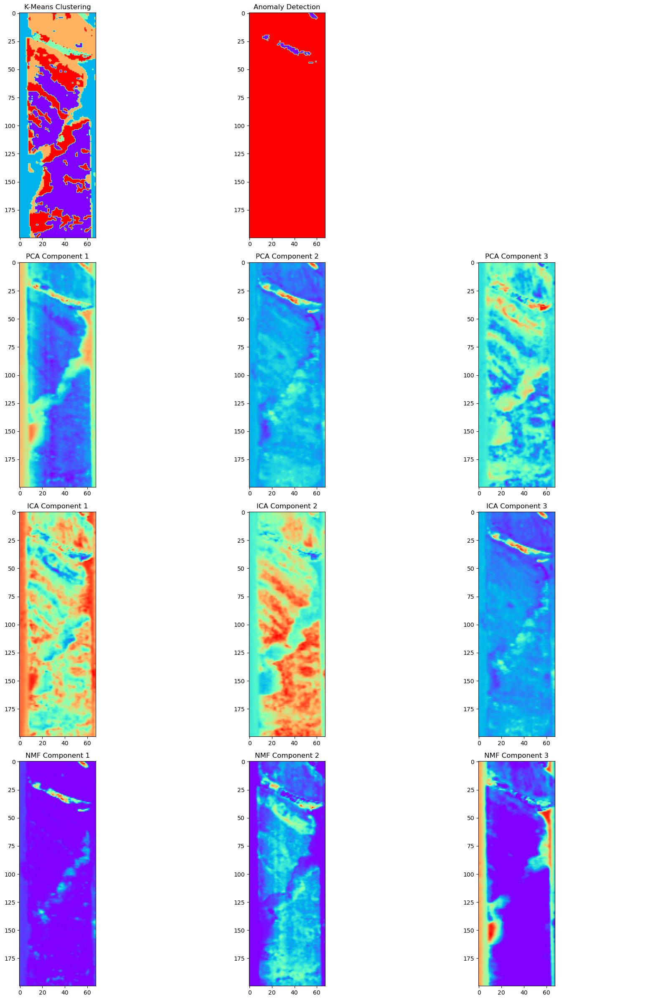

In [253]:
# Statistical analysis
pca_stats = describe(SWIR_pca, axis=0)
ica_stats = describe(SWIR_ica, axis=0)
nmf_stats = describe(SWIR_nmf, axis=0)

print("PCA Statistics:", pca_stats)
print("ICA Statistics:", ica_stats)
print("NMF Statistics:", nmf_stats)

# Clustering
kmeans = KMeans(n_clusters=5, random_state=0)
clusters = kmeans.fit_predict(SWIR_normalized)

# Reshape clusters for visualization
clusters_reshaped = clusters.reshape(nx, ny)

# Anomaly detection using Isolation Forest
isolation_forest = IsolationForest(contamination=0.01, random_state=0)
anomalies = isolation_forest.fit_predict(SWIR_normalized)
anomalies_reshaped = anomalies.reshape(nx, ny)

# Visualization
fig, axes = plt.subplots(4, 3, figsize=(18, 24))

# Clustering
axes[0, 0].imshow(clusters_reshaped, cmap='rainbow')
axes[0, 0].set_title('K-Means Clustering')

# PCA Components
for i in range(3):
    axes[1, i].imshow(SWIR_pca[:, i].reshape(nx, ny), cmap='rainbow')
    axes[1, i].set_title(f'PCA Component {i+1}')

# ICA Components
for i in range(3):
    axes[2, i].imshow(SWIR_ica[:, i].reshape(nx, ny), cmap='rainbow')
    axes[2, i].set_title(f'ICA Component {i+1}')

# NMF Components
for i in range(3):
    axes[3, i].imshow(SWIR_nmf[:, i].reshape(nx, ny), cmap='rainbow')
    axes[3, i].set_title(f'NMF Component {i+1}')

# Anomalies
axes[0, 1].imshow(anomalies_reshaped, cmap='rainbow')
axes[0, 1].set_title('Anomaly Detection')

axes[0, 2].axis('off')

plt.tight_layout()
plt.show()

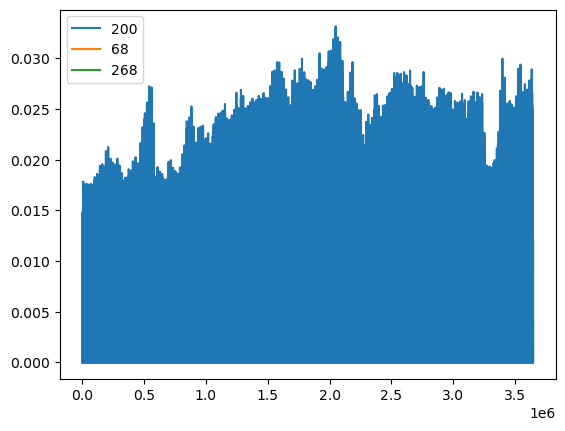

In [225]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import IsolationForest
from sklearn.metrics import mean_squared_error, accuracy_score

# Reading CSV Data
data = pd.read_csv(hyperspectral_text_path)

# Plotting CSV Data
data.plot()
plt.show()

In [226]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import IsolationForest
from sklearn.metrics import mean_squared_error, accuracy_score

# Reading CSV Data
data = pd.read_csv('data.csv')

# Plotting CSV Data
data.plot()
plt.show()

# Preprocessing CSV Data
# Handling missing values
data = data.fillna(method='ffill')
# Normalizing data
data = (data - data.mean()) / data.std()

# Post-Processing CSV Data
# Example: Calculate moving average
data['moving_avg'] = data['column_name'].rolling(window=5).mean()

# Statistical Analysis on CSV Data
# Summary statistics
summary_stats = data.describe()
print(summary_stats)

# Machine Learning with CSV Data (Example: Linear Regression)
X = data[['feature1', 'feature2']]
y = data['target']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
model = LinearRegression()
model.fit(X_train, y_train)
predictions = model.predict(X_test)

# Clustering CSV Data (Example: K-Means Clustering)
kmeans = KMeans(n_clusters=3, random_state=42)
data['cluster'] = kmeans.fit_predict(X)

# Classification with CSV Data (Example: Decision Tree)
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)
predictions = clf.predict(X_test)

# Anomaly Detection with CSV Data (Example: Isolation Forest)
isolation_forest = IsolationForest(contamination=0.1)
data['anomaly'] = isolation_forest.fit_predict(X)

# Evaluation
mse = mean_squared_error(y_test, predictions)
accuracy = accuracy_score(y_test, predictions)
print(f"Mean Squared Error: {mse}, Accuracy: {accuracy}")

# Plot Clusters (CSV Data)
plt.scatter(data['feature1'], data['feature2'], c=data['cluster'], cmap='viridis')
plt.colorbar()
plt.show()


C:\Users\sakbarpour\AppData\Local\Temp\ipykernel_29716\3585718275.py:3: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data = data.fillna(method='ffill')


KeyError: 'column_name'